<center style="padding: 3rem 2rem;
               border-radius: 20px;
               border: 4px solid #03fc77;
               text-align: center;
               ">
    <h1 style="color: #14d970; font-size: 2.5rem;">RSNA 2022 Cervical Spine Fracture Detection</h1>
    <h2 style="color: #14d970; padding: 0; margin: 0; font-size: 2rem;">Understanding the Dataset</h2>
    <h2 style="color: #14d970; padding: 0;  margin:1rem 0 2rem 0; font-size: 1.25rem;">(as a beginner)</h2>
    <a style="background-color: #14d970; 
              border-radius: 50px; 
              padding: 1rem 2rem; 
              width: 15%;
              text-decoration: none;
              color: white;
              font-size: 1rem;
              text-align: center;
              "
       href="https://kaggle.com/shreydan"
       >@shreydan</a>
</center>

### Please make sure to checkout the credits and references at the end!
___

# Installations & Imports
___
### from [@andradaolteanu](https://www.kaggle.com/andradaolteanu), [@ipythonx](https://www.kaggle.com/datasets/ipythonx/for-pydicom)

### Online

In [1]:
# !pip install -qU "python-gdcm" pydicom pylibjpeg "opencv-python-headless"

### Offline

In [2]:
!pip install -qU ../input/for-pydicom/python_gdcm-3.0.14-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl ../input/for-pydicom/pylibjpeg-1.4.0-py3-none-any.whl --find-links frozen_packages --no-index

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot, plot
from tqdm.notebook import tqdm
from pathlib import Path
from collections import Counter

tqdm.pandas()

In [4]:
# for dcm and nii
import pydicom
import nibabel as nib
from pydicom.pixel_data_handlers.util import apply_voi_lut

# **The Vertebral Column**
### **[Source: https://www.cancer.gov](https://www.cancer.gov/publications/dictionaries/cancer-terms/def/vertebral-column)**
___
The spine is made up of bones, muscles, tendons, nerves, and other tissues that reach from the base of the skull near the spinal cord (clivus) to the coccyx (tailbone). **The vertebrae (back bones) of the spine include the cervical spine (C1-C7)**, thoracic spine (T1-T12), lumbar spine (L1-L5), sacral spine (S1-S5), and the tailbone. Each vertebra is separated by a disc. The vertebrae surround and protect the spinal cord.

![](https://upload.wikimedia.org/wikipedia/commons/thumb/5/54/Gray_111_-_Vertebral_column-coloured.png/174px-Gray_111_-_Vertebral_column-coloured.png)

[Image Source](https://upload.wikimedia.org/wikipedia/commons/thumb/5/54/Gray_111_-_Vertebral_column-coloured.png/174px-Gray_111_-_Vertebral_column-coloured.png)

# **Learning More About the Cervical Spine**
### **[Source: https://my.clevelandclinic.org/](https://my.clevelandclinic.org/health/articles/22278-cervical-spine)**
___
## What is the cervical spine?
Your cervical spine — the neck area of your spine — consists of seven stacked bones called vertebrae. 
> Marked C1 to C7 in the above image

## What does the cervical spine do?
- Protecting your spinal cord.
- Supporting your head and allowing movement.
- Providing a safe passageway for vertebral arteries.

## Cervical Spine Fracture

A fracture to the bones of your spine can result from compression (often from minor trauma in a person with osteoporosis) or be a burst fracture (vertebra that’s crushed in all directions) or a fracture-dislocation (mostly from vehicle accidents or falls from heights).

## Tests and Imaging

**Computed tomography (CT) scan:** This scan uses X-rays and computers to produce images that are very thin “slices” of the area under examination. A CT scan can show the shape and size of your spinal canal, its contents and the bone around it. It helps diagnose bone spurs, osteophytes, bone fusion and bone destruction from infection or tumor.

___

# **Competition Goal**
___

The goal of this competition is to **identify fractures in CT scans of the cervical spine** (neck) at both the level of a single vertebrae and the entire patient.

*Quickly detecting and determining the location of any vertebral fractures is essential to prevent neurologic deterioration and paralysis after trauma.*

In [5]:
paths = {
    'train_df': Path('../input/rsna-2022-cervical-spine-fracture-detection/train.csv'),
    'train_bbox': Path('../input/rsna-2022-cervical-spine-fracture-detection/train_bounding_boxes.csv'),
    'train_images': Path('../input/rsna-2022-cervical-spine-fracture-detection/train_images'),
    'train_nifti_segments': Path('../input/rsna-2022-cervical-spine-fracture-detection/segmentations'),
    'test_df': Path('../input/rsna-2022-cervical-spine-fracture-detection/test.csv'),
    'test_images': Path('../input/rsna-2022-cervical-spine-fracture-detection/test_images')
}

# **Preparing Main DataFrame**
___

In [6]:
train_df = pd.read_csv(paths['train_df'])
test_df = pd.read_csv(paths['test_df'])

## Column Information
___

- `StudyInstanceUID` - The study ID. There is one unique study ID for each patient scan.
- `patient_overall` - One of the target columns. The patient level outcome, i.e. if any of the vertebrae are fractured.
- `C[1-7]` - The other target columns. Whether the given vertebrae is fractured. See this diagram for the real location of each vertbrae in the spine.


In [7]:
train_df.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0


## Ignoring a specific StudyInstanceUID
Discussion Link: [The scan 1.2.826.0.1.3680043.20574 does not include a full cervical spine and should be ignored. Thanks to @kretes for catching this.](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/344862)

In [8]:
train_df[train_df['StudyInstanceUID'] == '1.2.826.0.1.3680043.20574']

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7
1135,1.2.826.0.1.3680043.20574,1,0,1,0,0,0,0,0


In [9]:
train_df.drop(index=1135, inplace=True)
train_df.reset_index(drop=True, inplace=True)

In [10]:
train_df.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0


## adding `total_fractures` column to indicate how many cervical vertebrae are fractured

In [11]:
train_df['total_fractures'] = train_df.loc[:,[f"C{i}" for i in range(1,8)]].sum(axis=1)

In [12]:
train_df.head(2)

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0,2
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0,1


In [13]:
len(train_df)

2018

## **Now in total, We've 2018 study IDs**

___

# **Understanding CT Scans**

...A CT scan generates images that can be reformatted in multiple planes. It can even generate three-dimensional images...[read more](https://www.radiologyinfo.org/en/info/bodyct)

This allows multiple planes of observation, the most common one being axial.

![CT Scan Planes](https://www.ipfradiologyrounds.com/_images/image-reconstruction-planes.png)

[Image Source](https://www.ipfradiologyrounds.com/hrct-primer/image-reconstruction/)

### The data in `train_images` and `test_images` is segmented as per the axial plane.

## Adding segmentations path of each patient to the dataframe

In [14]:
train_df['segment_path'] = train_df['StudyInstanceUID'].map(lambda x: paths['train_images']/x)

In [15]:
train_df.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures,segment_path
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0,2,../input/rsna-2022-cervical-spine-fracture-det...
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0,0,../input/rsna-2022-cervical-spine-fracture-det...
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...


## Each patient has different number of slices, adding `num_slices` to each patient

In [16]:
def num_slices(path):
    slices = list(path.glob('*'))
    return len(slices)

train_df['num_slices'] = train_df['segment_path'].progress_map(num_slices)
train_df['num_slices'] = train_df['num_slices'].astype('int')

  0%|          | 0/2018 [00:00<?, ?it/s]

In [17]:
train_df.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures,segment_path,num_slices
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0,2,../input/rsna-2022-cervical-spine-fracture-det...,243
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,406
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,385
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0,0,../input/rsna-2022-cervical-spine-fracture-det...,501
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,199


In [18]:
train_df.head(2)

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures,segment_path,num_slices
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0,2,../input/rsna-2022-cervical-spine-fracture-det...,243
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,406


___
# **Some basic EDA**
___

In [19]:
fig = px.pie(train_df['patient_overall'].value_counts().reset_index(), 
       names=['not_fractured','fractured'], # [0,1]
       values='patient_overall',
       color_discrete_sequence = px.colors.qualitative.Pastel,
       title='Patient Fracture Overall Distribution'
      ).update_traces(textinfo='label+percent')
iplot(fig)

In [20]:
fractures = train_df.loc[:,[f"C{i}" for i in range(1,8)]].sum().reset_index()
fractures['not_fractured'] = fractures[0].map(lambda x:len(train_df)-x)
fractures.rename(columns={'index':'vertebra',0:'fractured'}, inplace=True)
fig = px.bar(fractures, 
             x='vertebra', 
             y=['fractured','not_fractured'],
             title='Fractures as per Vertebra',
             color_discrete_sequence = ['#e0465f','#afde2c'],
            )
iplot(fig)

In [21]:
fig = px.bar(train_df['total_fractures'].value_counts().reset_index(), 
             x='index', 
             y='total_fractures',
             title='No. of fractures amongst patients',
             text='total_fractures',
             color_discrete_sequence = ['#d82cde'],
            )
iplot(fig)

In [22]:
fig = px.histogram(train_df, x="num_slices")
iplot(fig)

___

# **Understanding the different medical-imaging file formats**

- `.dcm` - [DICOM](https://fileinfo.com/extension/dcm) file: A DCM file is an image file saved in the Digital Imaging and Communications in Medicine (DICOM) image format. It stores a medical image, such as a CT scan or ultrasound, and may also include patient information to pair the image with the patient. 

- `.nii` - [NIFTI file format](https://brainder.org/2012/09/23/the-nifti-file-format/) - [A nibabel image](https://nipy.org/nibabel/nibabel_images.html) object is the association of three things:
    - an N-D array containing the image data;
    - a (4, 4) affine matrix mapping array coordinates to coordinates in some RAS+ world coordinate space (Coordinate systems and affines);
    - image metadata in the form of a header.


___

# **Loading DICOM and NIFTI files**
### from [@andradaolteanu](https://www.kaggle.com/andradaolteanu) and [@harshitsheoran](https://www.kaggle.com/harshitsheoran)

## **Let's try opening a random `.dcm` and a `.nii` file**

## **.dcm**

In [23]:
random_dcm_file = list(train_df['segment_path'][123].glob('*'))[0]
print(random_dcm_file)
random_dcm_file = pydicom.dcmread(random_dcm_file)
print(random_dcm_file)

../input/rsna-2022-cervical-spine-fracture-detection/train_images/1.2.826.0.1.3680043.21724/257.dcm
Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.826.0.1.3680043.21724.1.257
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.3.0'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 1.2.826.0.1.3680043.21724.1.257
(0008, 0023) Content Date                        DA: '20220727'
(0008, 0033) Content Time                        TM: '181031.112496'
(0010, 0010) Patient's Name                      PN: '21724'
(0010, 0020) Patient ID                          LO: '21724'
(0018, 0050) Slice Th

In [24]:
# getting metadata with .get(key)
print("Instance Number:",random_dcm_file.get('InstanceNumber'))
print("Rows x Columns:", random_dcm_file.get("Rows"), random_dcm_file.get("Columns"))
print("Image Position (Patient):", random_dcm_file.get("ImagePositionPatient"))

Instance Number: 257
Rows x Columns: 512 512
Image Position (Patient): [-87.257, -14.763, -149.388]


## from the above metadata:
- patient ID = patient Name
- `Slice Thickness` = 1.0 mm [might not be same for all patients]
- `Instance Number` = slice number
- `Image Position (Patient)`: gives an array of values [x-axis, y-axis, z-axis], here z-axis denotes the position in the sagittal plane

`apply_voi_lut()` applies a windowing function to the image - [read more here](https://dicom.innolitics.com/ciods/ct-image/voi-lut/00281056)

In [25]:
dcm_image = apply_voi_lut(random_dcm_file.pixel_array, random_dcm_file)

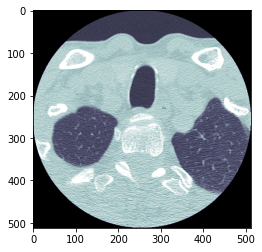

In [26]:
plt.imshow(dcm_image, cmap='bone')

___

## **.nii**

../input/rsna-2022-cervical-spine-fracture-detection/segmentations/1.2.826.0.1.3680043.32436.nii
(271, 512, 512) => (num_slices, height, width)


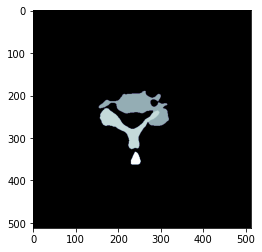

In [27]:
random_nii_file = list(paths['train_nifti_segments'].glob('*'))[10]
print(random_nii_file)

def open_nii_file(path):
    f = nib.load(path)
    segmentations = f.get_fdata()[:, ::-1, ::-1].transpose(2, 1, 0)
    return segmentations

nii_segments = open_nii_file(random_nii_file)
print(nii_segments.shape, "=> (num_slices, height, width)")
plt.imshow(nii_segments[123,:,:],cmap='bone')

### A caveat of axial plane is that we are not aware of which cervical vertebra we are looking at, the above `nii_segments` array can be reused to get the vertebra index using `np.unique()`

In [28]:
# np.unique(nii_segments[slice_number])
print("[background, *, vertebra]")
print("here 4. denotes that the slice is a part of C4 vertebra")
np.unique(nii_segments[100])

[background, *, vertebra]
here 4. denotes that the slice is a part of C4 vertebra


array([0., 3., 4.])

___

## not all study UIDs have nii segments, for the ones we do have, adding their path to df

In [29]:
f"We only have {len(list(paths['train_nifti_segments'].glob('*')))} nii files / {len(train_df)} studies"

'We only have 87 nii files / 2018 studies'

In [30]:
def add_nii_segment_path(uid):
    base_path = paths['train_nifti_segments']
    # path if exists else None
    path = base_path/(uid+'.nii')
    if path.exists():
        return path
    return None

train_df['nii_segments_path'] = train_df['StudyInstanceUID'].map(add_nii_segment_path)

In [31]:
train_df.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures,segment_path,num_slices,nii_segments_path
0,1.2.826.0.1.3680043.6200,1,1,1,0,0,0,0,0,2,../input/rsna-2022-cervical-spine-fracture-det...,243,None
1,1.2.826.0.1.3680043.27262,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,406,None
2,1.2.826.0.1.3680043.21561,1,0,1,0,0,0,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,385,None
3,1.2.826.0.1.3680043.12351,0,0,0,0,0,0,0,0,0,../input/rsna-2022-cervical-spine-fracture-det...,501,None
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,199,../input/rsna-2022-cervical-spine-fracture-det...


___

In [32]:
def get_dcm_images(path):
    paths = list(path.glob('*'))
    paths.sort(key=lambda x:int(x.stem)) # sort based on slice index which is the filename: index.dcm
    data = [pydicom.dcmread(f) for f in paths]
    images = [apply_voi_lut(dcm.pixel_array, dcm) for dcm in data]
    return images

In [33]:
def get_nii_segments(path):
    f = nib.load(path)
    segmentations = f.get_fdata()[:, ::-1, ::-1].transpose(2, 1, 0)
    return segmentations

In [34]:
sample_idx = 99
dcm_images = get_dcm_images(train_df['segment_path'][sample_idx])
nii_segments = get_nii_segments(train_df['nii_segments_path'][sample_idx])
print((len(dcm_images), *dcm_images[0].shape), nii_segments.shape)

(271, 512, 512) (271, 512, 512)


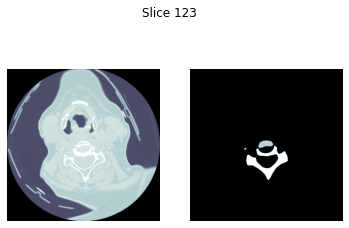

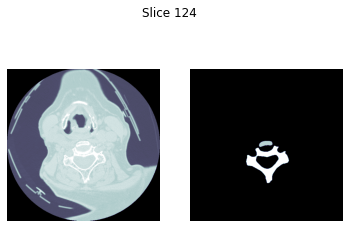

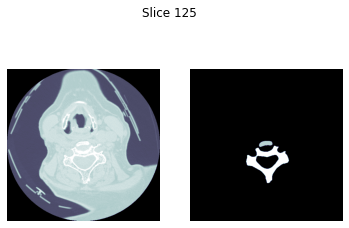

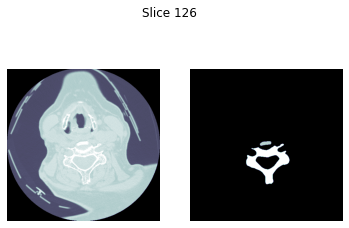

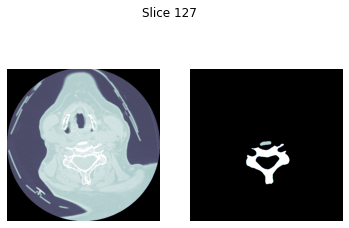

In [35]:
def plot_slice(idx, dcm_images=dcm_images, nii_segments=nii_segments):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.axis('off'); ax2.axis('off')
    fig.suptitle(f'Slice {idx}')
    ax1.imshow(dcm_images[idx], cmap='bone')
    ax2.imshow(nii_segments[idx,:,:], cmap='bone')

for i in range(123,128):
    plot_slice(i)

___

## all UIDs which have segmentations:

In [36]:
uids_with_segments = train_df[train_df['nii_segments_path'].notnull()]
uids_with_segments.head()

,StudyInstanceUID,patient_overall,C1,C2,C3,C4,C5,C6,C7,total_fractures,segment_path,num_slices,nii_segments_path
4,1.2.826.0.1.3680043.1363,1,0,0,0,0,1,0,0,1,../input/rsna-2022-cervical-spine-fracture-det...,199,../input/rsna-2022-cervical-spine-fracture-det...
41,1.2.826.0.1.3680043.25704,0,0,0,0,0,0,0,0,0,../input/rsna-2022-cervical-spine-fracture-det...,257,../input/rsna-2022-cervical-spine-fracture-det...
53,1.2.826.0.1.3680043.20647,0,0,0,0,0,0,0,0,0,../input/rsna-2022-cervical-spine-fracture-det...,263,../input/rsna-2022-cervical-spine-fracture-det...
60,1.2.826.0.1.3680043.31077,1,0,0,1,1,1,1,0,4,../input/rsna-2022-cervical-spine-fracture-det...,672,../input/rsna-2022-cervical-spine-fracture-det...
99,1.2.826.0.1.3680043.17960,0,0,0,0,0,0,0,0,0,../input/rsna-2022-cervical-spine-fracture-det...,271,../input/rsna-2022-cervical-spine-fracture-det...


___

# **some scans maybe in reverse order**

[A Segmentation is in reverse order by @itsuki9180](https://www.kaggle.com/code/itsuki9180/a-segmentation-is-in-reverse-order/comments) and [based on this comment by @abebe9849](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/348658#1918410)

#### based on [this discussion](https://www.kaggle.com/code/itsuki9180/a-segmentation-is-in-reverse-order/comments#1919812), for the z_pos value in ImagePositionPatient. If z_pos of last slice is greater than z_pos of first slice, then we've to reverse the order since positive is towards the head of the patient
___

In [37]:
def check_reverse_required(path):
    paths = list(path.glob('*'))
    paths.sort(key=lambda x:int(x.stem))
    z_first = pydicom.dcmread(paths[0]).get("ImagePositionPatient")[-1]
    z_last = pydicom.dcmread(paths[-1]).get("ImagePositionPatient")[-1]
    if z_last < z_first:
        return False
    return True

In [38]:
checks = train_df['segment_path'].progress_map(check_reverse_required)

  0%|          | 0/2018 [00:00<?, ?it/s]

In [39]:
train_df['reverse_required'] = checks

In [40]:
Counter(checks)

Counter({False: 1822, True: 196})

In [41]:
indices_where_reverse_required = [i for i,req in (checks.reset_index()).values if req is True]
print(indices_where_reverse_required)

[1, 4, 27, 30, 39, 47, 48, 66, 72, 80, 136, 151, 169, 176, 194, 195, 201, 209, 214, 232, 235, 243, 258, 262, 267, 281, 297, 332, 334, 336, 338, 339, 344, 372, 386, 391, 402, 407, 419, 421, 428, 435, 455, 467, 476, 488, 490, 502, 507, 510, 517, 534, 543, 558, 561, 567, 569, 572, 574, 588, 600, 606, 617, 633, 635, 640, 671, 680, 685, 702, 716, 721, 756, 777, 779, 787, 802, 803, 831, 832, 837, 840, 846, 870, 886, 888, 897, 906, 912, 913, 928, 937, 941, 943, 958, 978, 995, 999, 1011, 1017, 1022, 1024, 1041, 1055, 1056, 1074, 1075, 1086, 1094, 1102, 1104, 1108, 1120, 1138, 1142, 1157, 1168, 1196, 1222, 1226, 1237, 1255, 1274, 1283, 1310, 1332, 1339, 1346, 1382, 1383, 1393, 1395, 1407, 1408, 1412, 1431, 1437, 1444, 1467, 1481, 1484, 1486, 1487, 1494, 1496, 1497, 1504, 1509, 1513, 1524, 1529, 1530, 1531, 1538, 1554, 1566, 1583, 1587, 1594, 1607, 1614, 1636, 1638, 1642, 1664, 1666, 1674, 1682, 1701, 1711, 1717, 1725, 1763, 1772, 1796, 1822, 1840, 1841, 1855, 1860, 1867, 1872, 1883, 1909, 1922,

___

# **Generating Sagittal View**
### based on [this comment by @harshitsheoran](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/340612#1891123) which gives a decently usable saggital view

StudyInstanceUID                             1.2.826.0.1.3680043.25704
patient_overall                                                      0
C1                                                                   0
C2                                                                   0
C3                                                                   0
C4                                                                   0
C5                                                                   0
C6                                                                   0
C7                                                                   0
total_fractures                                                      0
segment_path         ../input/rsna-2022-cervical-spine-fracture-det...
num_slices                                                         257
nii_segments_path    ../input/rsna-2022-cervical-spine-fracture-det...
reverse_required                                                 False
Name: 

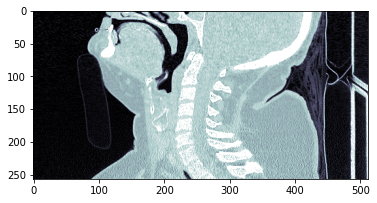

In [42]:
print(train_df.loc[41,:])
dcm_images = get_dcm_images(train_df['segment_path'][41]) # 0 fractures
dcm_np = np.array(dcm_images)
if train_df['reverse_required'][41] == True:
    dcm_np = dcm_np[::-1]
saggital_view = dcm_np[:,:,256]
plt.imshow(saggital_view, cmap='bone')

StudyInstanceUID                             1.2.826.0.1.3680043.31077
patient_overall                                                      1
C1                                                                   0
C2                                                                   0
C3                                                                   1
C4                                                                   1
C5                                                                   1
C6                                                                   1
C7                                                                   0
total_fractures                                                      4
segment_path         ../input/rsna-2022-cervical-spine-fracture-det...
num_slices                                                         672
nii_segments_path    ../input/rsna-2022-cervical-spine-fracture-det...
reverse_required                                                 False
Name: 

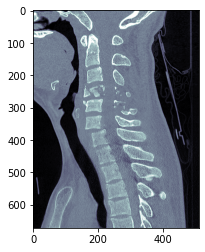

In [43]:
print(train_df.loc[60,:])
dcm_images = get_dcm_images(train_df['segment_path'][60]) # 4 fractures
dcm_np = np.array(dcm_images)
if train_df['reverse_required'][60] == True:
    dcm_np = dcm_np[::-1]
saggital_view = dcm_np[:,:,256]
plt.imshow(saggital_view, cmap='bone')

StudyInstanceUID                              1.2.826.0.1.3680043.1363
patient_overall                                                      1
C1                                                                   0
C2                                                                   0
C3                                                                   0
C4                                                                   0
C5                                                                   1
C6                                                                   0
C7                                                                   0
total_fractures                                                      1
segment_path         ../input/rsna-2022-cervical-spine-fracture-det...
num_slices                                                         199
nii_segments_path    ../input/rsna-2022-cervical-spine-fracture-det...
reverse_required                                                  True
Name: 

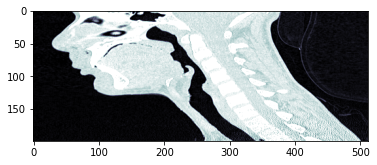

In [44]:
print(train_df.loc[4,:])
dcm_images = get_dcm_images(train_df['segment_path'][4]) # 4 fractures
dcm_np = np.array(dcm_images)
if train_df['reverse_required'][4] == True:
    dcm_np = dcm_np[::-1]
saggital_view = dcm_np[:,:,256]
plt.imshow(saggital_view, cmap='bone')

## You can run this to get all the saggital views


In [45]:
# !mkdir saggital_views

# saggital_path = Path('./saggital_views')
# for uid, path, rev in tqdm(train_df.loc[:,['StudyInstanceUID','segment_path','reverse_required']].values):
#     dcm_images = get_dcm_images(path)
#     dcm_np = np.array(dcm_images)
#     if rev == True:
#         dcm_np = dcm_np[::-1]
#     saggital_view = dcm_np[:,:,256]
#     plt.imsave(saggital_path/(uid+'.png'),saggital_view,cmap='bone')

## Saving

In [46]:
train_df.to_csv('train_new.csv')
uids_with_segments.to_csv('train_with_segments.csv')

___

# **Animation**
___

In [47]:
sample_index = train_df.iloc[99,:]
dcm_images = get_dcm_images(sample_index['segment_path'])
if sample_index['reverse_required'] == True:
    dcm_images.sort(reverse=True)
segments = get_nii_segments(sample_index['nii_segments_path'])

In [48]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

fig, [ax1,ax2] = plt.subplots(1,2)
ax1.axis('off')
ax2.axis('off')
images = []
for i in tqdm(range(len(dcm_images))):
    im1 = ax1.imshow(dcm_images[i], animated=True, cmap='bone')
    im2 = ax2.imshow(segments[i,:,:], animated=True, cmap='bone')
    if i==0:
        ax1.imshow(dcm_images[i], cmap='bone')
        ax2.imshow(segments[i,:,:], cmap='bone')
    images.append([im1,im2])
        

ani = animation.ArtistAnimation(fig, images, interval=50, blit=True,
                                repeat_delay=1000)
plt.close()
ani

  0%|          | 0/271 [00:00<?, ?it/s]

___

# **References**

> This community is incredible, a few days ago I had no idea what DICOM files were but today I have a basic understanding of how medical imaging works. I went through many notebooks and discussions to understand how everyone was handling the dataset.

## These are some references I used:
If I missed anything here, they should be in the notebook in the above markdown cells somewhere

- ### Discussions
    - #### [Explaining Data and Submission in detail](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/340612) by [@harshitsheoran](https://www.kaggle.com/harshitsheoran)
    > this was very helpful. @harshitsheoran explained everything perfectly which gave me the confidence to try out this dataset
    - #### [Order of Slices](https://www.kaggle.com/code/itsuki9180/a-segmentation-is-in-reverse-order/comments#1919812) by [@solverworld](https://www.kaggle.com/solverworld)
    - #### [Sorting the DICOM files](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/348658#1918410) by [@abebe9849](https://www.kaggle.com/abebe9849)
    - #### [Generating Saggital Views](https://www.kaggle.com/competitions/rsna-2022-cervical-spine-fracture-detection/discussion/340612#1891123) by [@harshitsheoran](https://www.kaggle.com/harshitsheoran)

- ### Notebooks
    - #### [rsna-fracture-detection-dicom-images-explore](https://www.kaggle.com/code/andradaolteanu/rsna-fracture-detection-dicom-images-explore) by [@andradaolteanu](https://www.kaggle.com/andradaolteanu)
    - #### [rsna-fracture-detection-in-depth-eda](https://www.kaggle.com/code/samuelcortinhas/rsna-fracture-detection-in-depth-eda) by [@samuelcortinhas](https://www.kaggle.com/samuelcortinhas)
    - #### [spine-fracture-eda-loading-dicom-3d-browse](https://www.kaggle.com/code/jirkaborovec/spine-fracture-eda-loading-dicom-3d-browse) by [@jirkaborovec](https://www.kaggle.com/jirkaborovec)
    - #### [a-segmentation-is-in-reverse-order](https://www.kaggle.com/code/itsuki9180/a-segmentation-is-in-reverse-order) by [@itsuki9180](https://www.kaggle.com/itsuki9180)
    



## Thank you to all the users for their work and help. It was fun to try this out :)
